# Clasificación de Ocupación en Transporte Público con YOLOv8
Este notebook entrena un modelo de detección y otro de segmentación con YOLOv8 para clasificar imágenes de buses según su nivel de ocupación: `low`, `medium`, `full`.

Autores: Wilberson Osorio y Juan jerónimo Manriquez

# Detección


In [7]:
!pip install ultralytics

In [2]:
import zipfile

with zipfile.ZipFile('/content/My First Project.v6i.yolov8.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')

Ahora vamos a optimizar hiperparámetros con model.tune, cabe aclarar que la primera vez usamos el modelo small pero queríamos mejores resultados, así que intentamos con medium, nunca intentamos con large porque se demora demasiado.

In [4]:
from ultralytics import YOLO

# Cargamos el modelo base para tuning
model = YOLO('yolov8m.pt')

# Ejecutamos tuning
model.tune(
    data='/content/dataset/data.yaml',
    epochs=50,
    imgsz=640,
    iterations=10,          # Número de combinaciones a probar
    optimizer='Adam',
    plots=True
)

Tuner: Initialized Tuner instance with 'tune_dir=runs/detect/tune2'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/10 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'cutmix': 0.0, 'copy_paste': 0.0}
Saved runs/detect/tune2/tune_scatter_plots.png
Saved runs/detect/tune2/tune_fitness.png

Tuner: 1/10 iterations complete ✅ (197.48s)
Tuner: Results saved to runs/detect/tune2
Tuner: Best fitness=0.05214 observed at iteration 1
Tuner: Best fitness metrics are {'metrics/precision(B)': 0.25853, 'metrics/recall(B)': 0.2037, 'metrics/mAP50(B)': 0.12782, 'metrics/mAP50-95(B)': 0.04373, 'val/box_loss': 2.58695,

In [11]:
# Probamos un modelo sin optimizar hiperparámetros a ver cómo da
model = YOLO("yolov8m.pt")

results = model.train(
    data="/content/dataset/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
)

Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train12, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretraine

train: Scanning /content/dataset/train/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 550.7±290.8 MB/s, size: 60.4 KB)


val: Scanning /content/dataset/valid/labels.cache... 8 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8/8 [00:00<?, ?it/s]


Plotting labels to runs/detect/train12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train12
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.71G      2.439      3.318      2.092         96        640: 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.73it/s]

                   all          8         54     0.0893       0.13      0.039     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.71G      2.207      2.461      1.914        115        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.19it/s]

                   all          8         54      0.284      0.426      0.176     0.0709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.71G       1.91       1.85      1.692        113        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

                   all          8         54       0.38      0.481      0.331       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.73G      1.776      1.524       1.59        105        640: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all          8         54      0.396      0.296      0.224     0.0554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.74G      1.799      1.741      1.583         58        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

                   all          8         54      0.415      0.444      0.394      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.75G      1.802      1.683       1.55        145        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.41it/s]

                   all          8         54      0.546      0.445      0.417      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.75G      1.706      1.387      1.521         96        640: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.58it/s]

                   all          8         54      0.217       0.37       0.16      0.053



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.75G      1.674      1.308      1.508         75        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

                   all          8         54     0.0897      0.278     0.0519     0.0199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.75G      1.583      1.225       1.45        109        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

                   all          8         54     0.0313      0.333     0.0219    0.00879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.81G      1.625       1.22      1.456         69        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

                   all          8         54      0.177      0.241      0.112     0.0258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.88G      1.622       1.24      1.453         70        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]

                   all          8         54      0.211       0.13     0.0718     0.0158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.95G      1.536      1.148      1.416        153        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

                   all          8         54     0.0708      0.204     0.0411    0.00814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.01G      1.577      1.161      1.444        180        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.142      0.222        0.1     0.0302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.08G      1.545      1.055      1.462        112        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

                   all          8         54      0.137      0.185     0.0682     0.0289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.15G      1.471     0.9981      1.359        106        640: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


                   all          8         54      0.128     0.0926     0.0698     0.0252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.15G      1.564      1.021      1.391        107        640: 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

                   all          8         54      0.128      0.185     0.0424     0.0114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.15G      1.378      0.938      1.322         79        640: 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

                   all          8         54      0.262       0.13      0.086     0.0284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.15G      1.477     0.8908      1.347        139        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]

                   all          8         54      0.219       0.13     0.0601     0.0162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.15G      1.402      1.084       1.36         68        640: 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]

                   all          8         54     0.0115     0.0926    0.00511    0.00154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.15G      1.408     0.9422       1.35         99        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

                   all          8         54    0.00754      0.222    0.00395   0.000866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.15G      1.365     0.9545      1.326        111        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.90it/s]

                   all          8         54    0.00467      0.185     0.0031   0.000534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.15G      1.352      0.946      1.323         95        640: 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

                   all          8         54     0.0244     0.0185    0.00215   0.000474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.15G      1.353     0.9622       1.35         77        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

                   all          8         54       0.31      0.037     0.0181    0.00465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.15G       1.48      1.001      1.355        122        640: 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.76it/s]

                   all          8         54      0.224      0.037     0.0267    0.00975



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.15G      1.341      0.876       1.31        127        640: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.36it/s]

                   all          8         54     0.0534      0.037     0.0132    0.00199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.15G      1.316     0.8836      1.251        121        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.57it/s]

                   all          8         54     0.0555     0.0185    0.00446   0.000794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.15G      1.299     0.7841      1.233        127        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

                   all          8         54    0.00299       0.13    0.00194   0.000664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.15G      1.356     0.8162      1.277         86        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all          8         54     0.0281     0.0556    0.00862     0.0025



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.15G      1.232     0.7794      1.205        115        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

                   all          8         54      0.489       0.13      0.122     0.0463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.15G      1.168     0.7348      1.209        137        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.32it/s]

                   all          8         54      0.623      0.148      0.169     0.0635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      7.15G      1.236       0.78      1.233        137        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.63it/s]

                   all          8         54      0.224      0.222      0.176     0.0714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.15G      1.217     0.7748      1.244        117        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]

                   all          8         54      0.442      0.147       0.17     0.0615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.15G      1.367     0.7976      1.298        102        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

                   all          8         54      0.307       0.13      0.144     0.0462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.15G      1.208     0.7591      1.187        135        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

                   all          8         54      0.303      0.204      0.138     0.0455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.15G      1.241     0.7572      1.251        109        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

                   all          8         54      0.286      0.259       0.15     0.0464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.15G      1.184     0.7267      1.196        108        640: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.65it/s]

                   all          8         54       0.55      0.222      0.228     0.0749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.15G      1.162     0.6859      1.197        116        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

                   all          8         54      0.269      0.352      0.198     0.0686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.15G      1.089     0.6725      1.138        138        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all          8         54      0.369      0.278      0.239     0.0938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.15G      1.164     0.7014      1.192        105        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.41it/s]

                   all          8         54      0.476      0.315      0.334      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.15G      1.029     0.6264      1.103        113        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

                   all          8         54      0.329       0.37      0.249     0.0861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.15G      1.105     0.6286      1.114        122        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

                   all          8         54      0.246      0.278      0.148     0.0546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.15G      1.128     0.6811      1.172        120        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

                   all          8         54      0.367      0.259      0.201     0.0735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.15G      1.129     0.6777      1.165        150        640: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.23it/s]

                   all          8         54      0.359       0.37      0.288      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.15G      1.026     0.6609      1.077        107        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.71it/s]

                   all          8         54      0.531      0.315      0.309      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.15G      1.023     0.6334      1.109        135        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

                   all          8         54      0.501      0.352       0.31      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.15G      1.048     0.6372      1.131        102        640: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.14it/s]

                   all          8         54      0.613        0.5      0.423       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.15G      1.037      0.579      1.092        125        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          8         54      0.571      0.426      0.418      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.15G     0.9631     0.5676       1.06        121        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

                   all          8         54      0.791      0.296      0.361      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.15G      1.038     0.6124      1.069        127        640: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]

                   all          8         54      0.507      0.278      0.252      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.15G     0.9789     0.6045      1.083        146        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

                   all          8         54      0.277      0.259      0.188      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.15G     0.9633     0.5711      1.072         79        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          8         54      0.308      0.278      0.194      0.094



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.15G     0.9668     0.5762      1.079        133        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

                   all          8         54      0.503      0.222      0.237      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.15G     0.9459     0.5635      1.058         92        640: 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

                   all          8         54      0.497      0.389      0.351      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.15G     0.9565     0.5657      1.068         68        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

                   all          8         54      0.636      0.407      0.379      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.15G     0.9438     0.5577      1.065        159        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

                   all          8         54      0.511       0.37      0.328      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.15G     0.9499     0.5571      1.054        104        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

                   all          8         54      0.497       0.37      0.313      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.15G     0.9358     0.5369       1.04        136        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

                   all          8         54      0.573      0.333      0.351      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.15G     0.8995     0.5478      1.027        181        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

                   all          8         54      0.598      0.358       0.38      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.15G     0.8377     0.5195      1.039         98        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

                   all          8         54      0.745      0.352      0.384      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.15G     0.8669     0.5145      1.037        134        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]

                   all          8         54      0.758      0.349      0.383      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.15G     0.8981     0.5522      1.066         81        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

                   all          8         54      0.701      0.296      0.366      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.15G     0.8476     0.5186      1.022        147        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.95it/s]

                   all          8         54      0.519      0.315      0.333      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.15G     0.8338     0.5094      1.029         81        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

                   all          8         54      0.562      0.296      0.272      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.15G     0.8755     0.5218      1.055        155        640: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.71it/s]

                   all          8         54      0.544      0.287      0.293      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.15G     0.8436     0.5123      1.038         65        640: 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.16it/s]

                   all          8         54      0.532      0.278      0.301      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.15G     0.8704     0.5264      1.021         80        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

                   all          8         54      0.613      0.259      0.322      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.15G     0.8242     0.4936      1.013        105        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.94it/s]

                   all          8         54      0.537      0.315      0.403      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.15G     0.8041     0.4737      1.001        129        640: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.27it/s]

                   all          8         54      0.798      0.293      0.404      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.15G     0.7723     0.4629     0.9916        107        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

                   all          8         54      0.569      0.426      0.438      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.15G     0.8094     0.4788      1.014        151        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

                   all          8         54      0.532      0.444      0.447      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.15G      0.799     0.4867       1.01         94        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

                   all          8         54      0.642      0.399      0.427      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.15G     0.8037     0.4542     0.9801        114        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

                   all          8         54      0.613      0.389      0.392      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.15G     0.8005     0.4752      1.006         94        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

                   all          8         54       0.63      0.426      0.413      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.15G     0.8111     0.5035      1.029        104        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

                   all          8         54      0.651      0.407      0.428       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.15G     0.7818      0.463     0.9733        148        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

                   all          8         54      0.577      0.404       0.43      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.15G     0.7339       0.46     0.9431        124        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.533      0.426      0.426      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.15G     0.7543     0.4762     0.9939         95        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.90it/s]

                   all          8         54      0.566      0.386      0.393      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.15G     0.7662     0.4508     0.9701        119        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all          8         54      0.543       0.37      0.369      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.15G     0.7374      0.455     0.9573         94        640: 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]

                   all          8         54      0.577      0.328       0.33      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.15G     0.7144     0.4452     0.9701        105        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.92it/s]

                   all          8         54      0.506      0.333       0.33      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.15G     0.7163     0.4418      0.974         77        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

                   all          8         54       0.63      0.296      0.335       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.15G     0.6984      0.411     0.9215        123        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

                   all          8         54      0.629      0.345      0.354       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.15G     0.7514     0.4527     0.9727         84        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.90it/s]

                   all          8         54      0.578      0.352       0.37      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.15G     0.7153     0.4318     0.9453        118        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

                   all          8         54      0.518      0.377      0.367       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.15G     0.7149     0.4168     0.9736        131        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

                   all          8         54      0.512      0.389      0.396      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.15G     0.7043     0.4098     0.9597         50        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.33it/s]

                   all          8         54      0.653      0.313      0.379      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.15G     0.7135     0.4301     0.9873         80        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

                   all          8         54      0.657      0.315      0.374       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.15G     0.6391     0.3987     0.9261         96        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

                   all          8         54      0.652      0.333      0.381      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.15G     0.6517     0.3862     0.9318         90        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

                   all          8         54      0.619      0.333      0.389      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.15G     0.7161      0.427      0.935        115        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]

                   all          8         54      0.616      0.333      0.376      0.153


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.15G     0.6838     0.3976      0.938         69        640: 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

                   all          8         54      0.579      0.333      0.375      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.15G     0.6526     0.3731     0.9384         70        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

                   all          8         54      0.567      0.333       0.37      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.15G     0.6289     0.3804      0.903         63        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

                   all          8         54      0.558      0.333      0.373      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.15G     0.5607     0.3482     0.9045         66        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]

                   all          8         54      0.606      0.333      0.377      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.15G     0.5962      0.359     0.9187         89        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.96it/s]

                   all          8         54      0.699      0.352      0.415      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.15G     0.5855     0.3685     0.9281         58        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.28it/s]

                   all          8         54      0.733      0.352      0.422      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.15G     0.6054     0.3463     0.9098        102        640: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]

                   all          8         54      0.773      0.352      0.435      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.15G     0.5844     0.3549     0.8967         69        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.94it/s]

                   all          8         54      0.753      0.352      0.434      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.15G     0.5548     0.3422     0.8772         54        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

                   all          8         54      0.704       0.37      0.433      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.15G     0.5689     0.3507     0.9011         93        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

                   all          8         54      0.701       0.37      0.429      0.175



100 epochs completed in 0.097 hours.
Optimizer stripped from runs/detect/train12/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train12/weights/best.pt, 52.0MB

Validating runs/detect/train12/weights/best.pt...
Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


                   all          8         54      0.752      0.352      0.432      0.175
Speed: 0.3ms preprocess, 14.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train12


In [12]:
results

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4e02bee610>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [7]:
import yaml

# Cargamos hiperparámetros desde el archivo generado por tune
with open("runs/detect/tune2/best_hyperparameters.yaml", "r") as f:
    hyp_params = yaml.safe_load(f)

In [9]:
# Probamos el modelo con los hiperparámetros optimizados
from ultralytics import YOLO

model = YOLO("yolov8m.pt")

resultspro = model.train(
    data="/content/dataset/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    name="yolo_personas_tuned",
    **hyp_params  # Aquí los hiperparámetros se expanden
)

Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.30615, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.44271, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.43173, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.42616, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.76403, hsv_v=0.40555, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.00933, lrf=0.01038, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.92488, mosaic=1.0, multi_scale=False, name=yolo_personas_tuned, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, persp

train: Scanning /content/dataset/train/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 562.6±390.1 MB/s, size: 60.4 KB)


val: Scanning /content/dataset/valid/labels.cache... 8 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8/8 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo_personas_tuned/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00933' and 'momentum=0.92488' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.00052), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolo_personas_tuned
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       6.1G      2.383      2.964      1.992         98        640: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

                   all          8         54      0.251      0.148      0.109     0.0337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.18G      2.162      2.074      1.824        117        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all          8         54       0.36      0.537      0.249      0.091



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.25G      1.958      1.827      1.634        113        640: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          8         54      0.408      0.352      0.235      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.25G       1.79      1.502      1.452        117        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.03it/s]

                   all          8         54      0.186      0.426      0.128     0.0482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.26G      1.756      1.339      1.445         57        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all          8         54      0.385       0.43      0.277      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.33G      1.778      1.217      1.429        148        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          8         54       0.62      0.315      0.294      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       6.5G      1.698      1.269      1.421        100        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.37it/s]

                   all          8         54      0.346      0.222      0.212     0.0785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.56G      1.638      1.176      1.397         78        640: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

                   all          8         54      0.225      0.111     0.0796     0.0273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.56G      1.583       1.02      1.361        111        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.63it/s]

                   all          8         54      0.236     0.0556     0.0242    0.00921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.56G      1.589      0.991      1.315         72        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

                   all          8         54    0.00668      0.148    0.00431   0.000809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.56G      1.627      1.081       1.35         70        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

                   all          8         54     0.0668      0.111     0.0234    0.00956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.64G       1.46      1.019      1.297        158        640: 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.69it/s]

                   all          8         54     0.0376     0.0926     0.0123    0.00396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.64G      1.571       1.06      1.362        184        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

                   all          8         54      0.154      0.111      0.068     0.0239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.64G      1.486      1.034      1.329        114        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all          8         54     0.0309      0.148     0.0188    0.00604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.64G      1.547      1.072      1.298        111        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]

                   all          8         54      0.021      0.185    0.00643    0.00243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.64G       1.45      1.045      1.263        117        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

                   all          8         54     0.0229      0.111     0.0113    0.00416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.64G       1.39     0.9464      1.251         81        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]

                   all          8         54     0.0298     0.0926     0.0121    0.00474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.64G       1.42     0.8826      1.226        151        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

                   all          8         54    0.00801      0.278    0.00513    0.00145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.64G      1.413      1.021       1.31         71        640: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.02it/s]

                   all          8         54    0.00782      0.241    0.00418    0.00154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.64G      1.417     0.8962      1.265        103        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all          8         54     0.0151      0.241    0.00729    0.00285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.64G      1.522     0.9163      1.315        112        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.98it/s]

                   all          8         54     0.0389      0.389     0.0279    0.00903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.64G      1.349     0.9005       1.26         96        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

                   all          8         54     0.0186      0.315     0.0114    0.00482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.64G      1.386     0.8721      1.269         80        640: 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.60it/s]

                   all          8         54     0.0244       0.37     0.0161    0.00601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.75G      1.364     0.8725      1.196        129        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]

                   all          8         54     0.0745      0.407     0.0519     0.0167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.97G       1.37     0.8236      1.243        130        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.72it/s]

                   all          8         54     0.0793       0.37     0.0477      0.013



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.97G      1.361     0.8092      1.195        122        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

                   all          8         54      0.247      0.241      0.117     0.0435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.97G      1.348     0.7542      1.218        132        640: 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]

                   all          8         54      0.213      0.204      0.132     0.0362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         7G      1.318     0.7578      1.206         88        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.78it/s]

                   all          8         54      0.208      0.185      0.119     0.0326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         7G      1.254     0.7216       1.14        117        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

                   all          8         54      0.107      0.185     0.0572     0.0166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         7G      1.184     0.6901      1.154        154        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.50it/s]

                   all          8         54      0.281      0.148     0.0807     0.0238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         7G      1.325     0.7336       1.18        142        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all          8         54      0.287      0.278      0.192      0.057



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         7G      1.237     0.7075      1.156        130        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

                   all          8         54      0.164      0.222     0.0698     0.0173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         7G      1.168     0.6969      1.134        103        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          8         54      0.308      0.185      0.156     0.0536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         7G      1.223     0.6628      1.108        147        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

                   all          8         54      0.175       0.13     0.0613     0.0155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         7G      1.206      0.712      1.169        116        640: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          8         54      0.182      0.222      0.115     0.0311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         7G      1.109     0.6307      1.103        114        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]

                   all          8         54      0.207      0.278      0.127     0.0422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         7G      1.112     0.6119      1.081        125        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.253      0.167      0.114     0.0361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         7G      1.081     0.6174      1.066        148        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.17it/s]

                   all          8         54      0.286      0.204      0.145     0.0423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         7G      1.149     0.6341      1.087        103        640: 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

                   all          8         54      0.217      0.259      0.135     0.0346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         7G        1.1     0.5899      1.068        120        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]

                   all          8         54      0.222      0.204       0.15     0.0377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.04G      1.056     0.5704      1.022        125        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.359      0.259      0.214     0.0668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.04G      1.086     0.6294      1.069        124        640: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

                   all          8         54      0.667      0.186      0.274       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.04G      1.154     0.6384      1.097        154        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]

                   all          8         54      0.366      0.364      0.288      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.04G      1.005      0.587      1.004        112        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all          8         54      0.453      0.259       0.24     0.0793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.04G     0.9857     0.5866      1.031        140        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.20it/s]

                   all          8         54       0.42      0.241      0.212      0.063



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.04G      1.009     0.5878      1.039        103        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

                   all          8         54       0.31      0.241      0.166     0.0401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.04G      1.019     0.5637      1.012        128        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

                   all          8         54      0.277      0.222      0.117     0.0352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.04G     0.9439     0.5509     0.9937        123        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

                   all          8         54      0.292      0.278      0.151     0.0439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.04G      0.965     0.5535     0.9993        137        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

                   all          8         54      0.213      0.315      0.139     0.0421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.04G     0.9732     0.5642      1.001        153        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.51it/s]

                   all          8         54      0.158      0.241      0.097     0.0243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.04G     0.9478     0.5355     0.9902         87        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.38it/s]

                   all          8         54      0.184      0.222      0.105     0.0298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.04G     0.9636     0.5394      1.028        137        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

                   all          8         54      0.283      0.185      0.155     0.0556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.04G      0.946     0.5196      1.001         95        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

                   all          8         54       0.23      0.259      0.163      0.054



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.04G     0.9113     0.4983     0.9705         68        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

                   all          8         54      0.475      0.222      0.219     0.0829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.04G      1.011     0.5004      1.011        171        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]

                   all          8         54      0.291      0.389      0.257     0.0828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.04G     0.9423     0.5076     0.9908        106        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

                   all          8         54      0.367      0.296      0.241     0.0841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.04G     0.9411     0.4843     0.9785        144        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]

                   all          8         54      0.288      0.407      0.249     0.0895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.04G      0.935     0.4887      0.994        197        640: 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.585      0.222       0.23     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.04G     0.8616     0.4989     0.9801         99        640: 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.87it/s]

                   all          8         54      0.394      0.259      0.219     0.0962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.04G     0.8848     0.4985     0.9842        141        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.55it/s]

                   all          8         54      0.409      0.278      0.223     0.0999



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.04G     0.8906     0.5044     0.9931         82        640: 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]

                   all          8         54      0.436      0.296      0.225      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.04G     0.8246     0.4775     0.9498        147        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.74it/s]

                   all          8         54      0.476      0.296      0.287      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.04G     0.8376     0.4597     0.9647         84        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

                   all          8         54      0.438      0.259      0.238      0.095



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.04G     0.9318     0.5106      1.013        158        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.01it/s]

                   all          8         54      0.411      0.333      0.232     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.04G     0.8537     0.4724     0.9574         67        640: 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.456      0.352      0.258     0.0954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.04G     0.8817     0.4619     0.9502         79        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

                   all          8         54      0.371      0.278      0.244      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.04G     0.8679     0.4728     0.9648        109        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.93it/s]

                   all          8         54      0.327      0.333      0.274      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.04G     0.8286     0.4454     0.9408        141        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all          8         54      0.568      0.278       0.29       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.04G     0.7578     0.4308     0.9269        110        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]

                   all          8         54      0.582      0.315      0.319      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.04G     0.8263     0.4627     0.9646        156        640: 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.71it/s]

                   all          8         54      0.617      0.352      0.367      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.04G     0.7939     0.4532     0.9386         94        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]

                   all          8         54      0.747      0.296      0.367      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.04G     0.7799     0.4257     0.9205        128        640: 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.00it/s]

                   all          8         54      0.827      0.315      0.389      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.04G      0.784     0.4272      0.949         94        640: 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.61it/s]

                   all          8         54      0.771      0.312      0.373      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.04G     0.8045      0.447     0.9682        103        640: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]

                   all          8         54      0.828      0.296      0.333      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.04G      0.786     0.4132     0.9068        154        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.82it/s]

                   all          8         54      0.713      0.278      0.332      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.04G     0.8029     0.4243     0.9184        137        640: 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.52it/s]

                   all          8         54      0.702      0.278      0.346      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.04G     0.7972      0.443     0.9475        105        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

                   all          8         54       0.68      0.315       0.39      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.11G     0.7957     0.4232     0.9151        125        640: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.47it/s]

                   all          8         54      0.663        0.4      0.454      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.11G     0.7767     0.4279      0.916         93        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]

                   all          8         54      0.698      0.389      0.441      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.11G     0.7716     0.4068     0.9246        107        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.30it/s]

                   all          8         54      0.816       0.37      0.463      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.11G     0.7499     0.4114     0.9299         77        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]

                   all          8         54      0.795       0.36      0.461      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.11G     0.7187     0.3883     0.8819        124        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]

                   all          8         54      0.758      0.352      0.447      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.11G     0.7539     0.4101     0.9137         84        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]

                   all          8         54      0.763      0.333      0.446      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.11G     0.7028     0.3938     0.8874        126        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.08it/s]

                   all          8         54      0.665      0.315       0.41      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.11G     0.7141     0.3827     0.9092        135        640: 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

                   all          8         54      0.585       0.37      0.406      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.11G     0.6855     0.3851     0.9013         51        640: 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all          8         54       0.62      0.389      0.412      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.11G     0.7099     0.3851     0.9195         81        640: 100%|██████████| 4/4 [00:01<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

                   all          8         54      0.627       0.37      0.417      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.11G     0.6357     0.3606     0.8854         97        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

                   all          8         54        0.9      0.333      0.422      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.11G     0.6455     0.3473      0.876         93        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.34it/s]

                   all          8         54      0.623      0.407      0.425      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.11G     0.7145     0.3829     0.8802        114        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

                   all          8         54      0.694       0.37      0.419        0.2


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.11G     0.6812     0.3445     0.8899         67        640: 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

                   all          8         54      0.664      0.402      0.423      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.11G     0.6412     0.3499     0.8899         70        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all          8         54       0.66      0.407      0.414       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.11G     0.6583     0.3616      0.877         63        640: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

                   all          8         54      0.617      0.407      0.409      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.11G     0.5991     0.3146     0.8512         64        640: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

                   all          8         54      0.574      0.389      0.426      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.11G     0.6116     0.3301     0.8645         87        640: 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all          8         54      0.761      0.352      0.441      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.11G     0.6014     0.3244     0.8644         57        640: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]

                   all          8         54      0.738      0.315      0.381      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.11G     0.6345     0.3187     0.8607        102        640: 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.92it/s]

                   all          8         54      0.719      0.315      0.374      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.11G     0.5946     0.3144     0.8508         67        640: 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.88it/s]

                   all          8         54      0.705      0.315       0.37      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.11G     0.5758     0.3214     0.8366         53        640: 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

                   all          8         54      0.693      0.315       0.37      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.11G     0.5817     0.3242     0.8577         93        640: 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.08it/s]

                   all          8         54      0.702      0.315      0.367      0.171



100 epochs completed in 0.096 hours.
Optimizer stripped from runs/detect/yolo_personas_tuned/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolo_personas_tuned/weights/best.pt, 52.0MB

Validating runs/detect/yolo_personas_tuned/weights/best.pt...
Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


                   all          8         54      0.756      0.352      0.447      0.202
Speed: 0.3ms preprocess, 15.4ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/yolo_personas_tuned


In [10]:
resultspro

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4e03654490>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

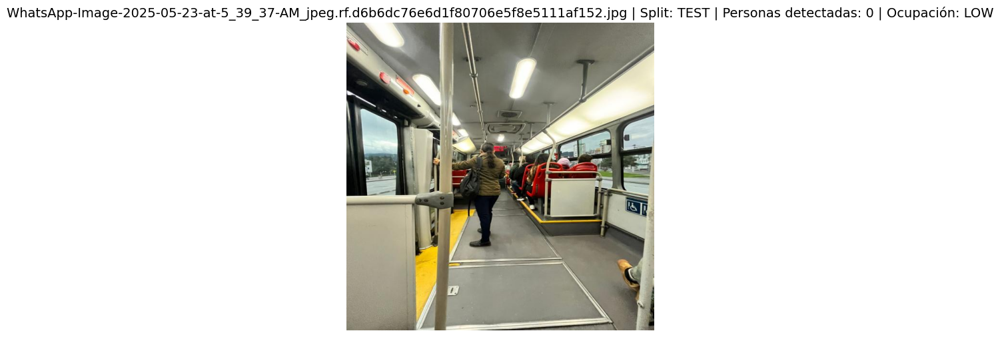

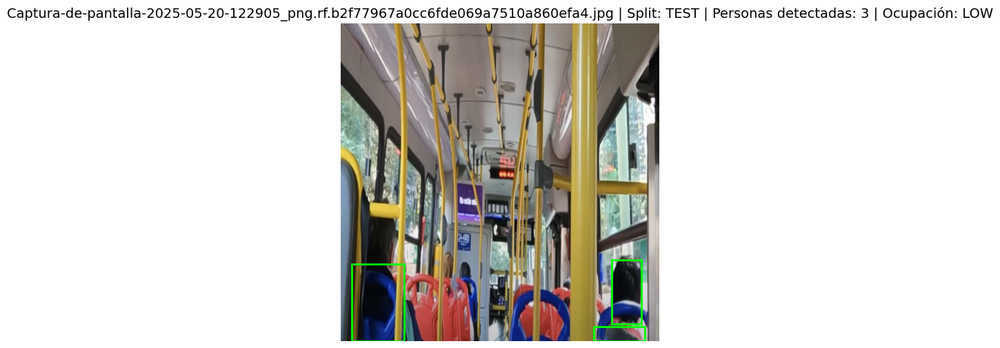

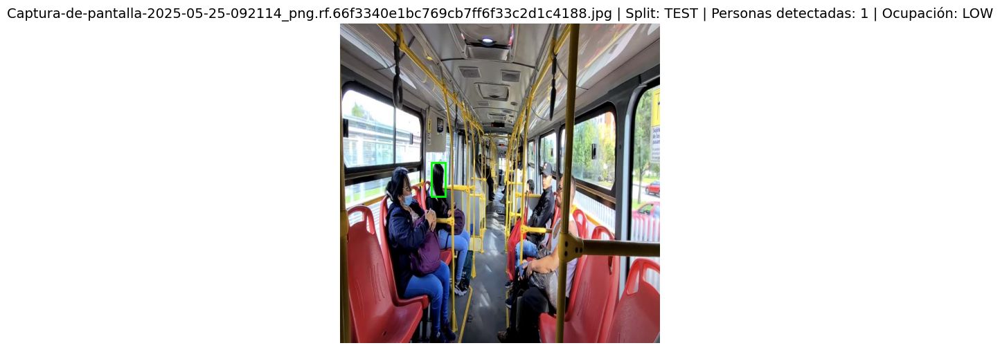

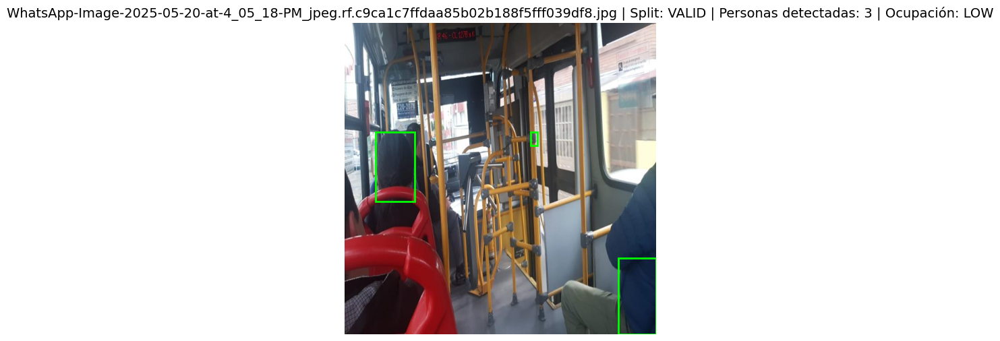

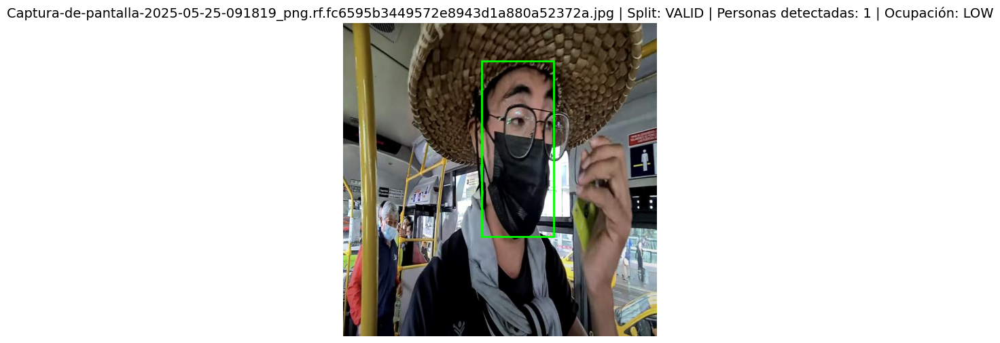

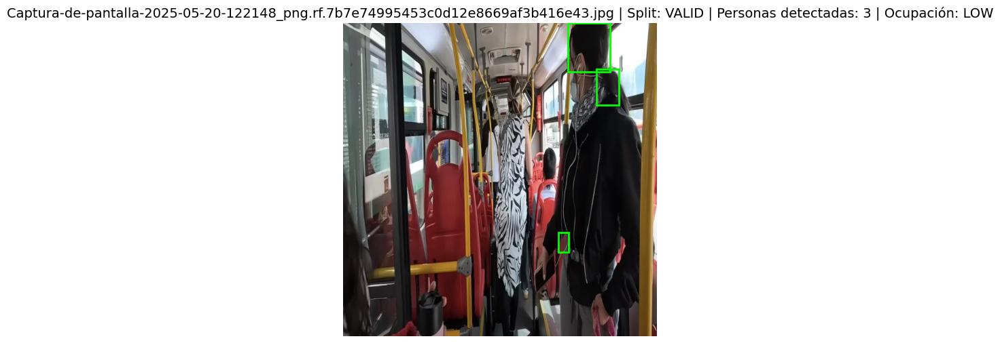

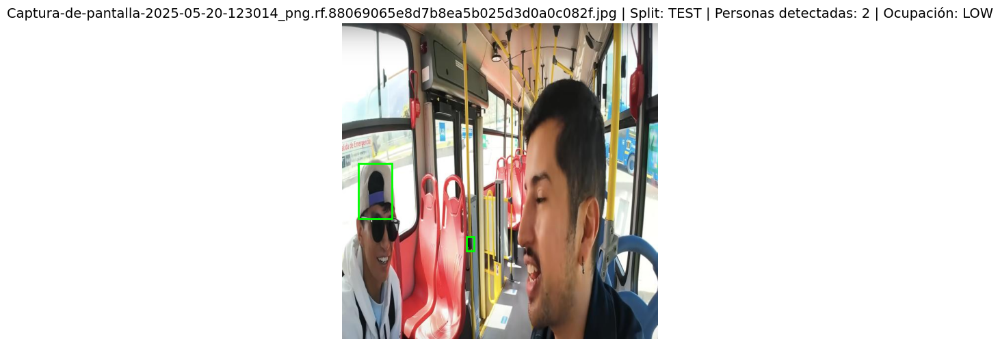

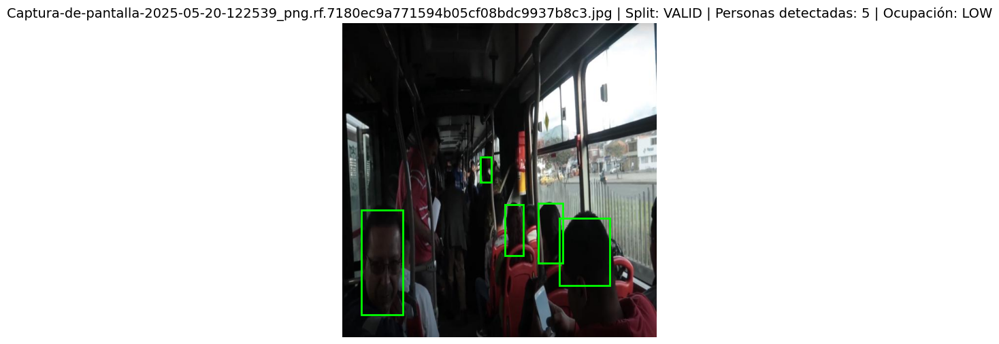

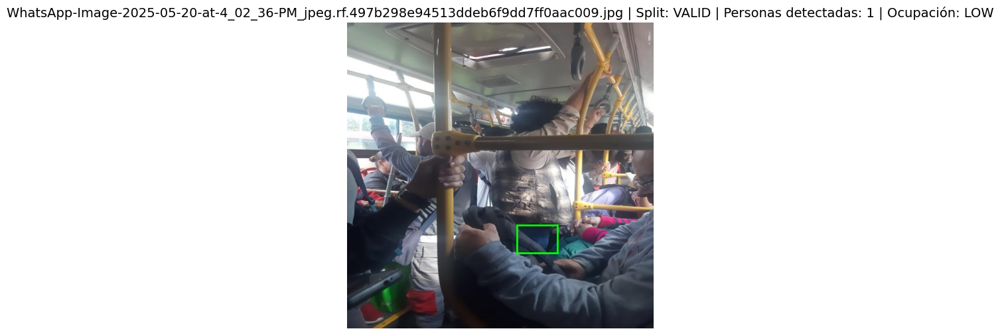

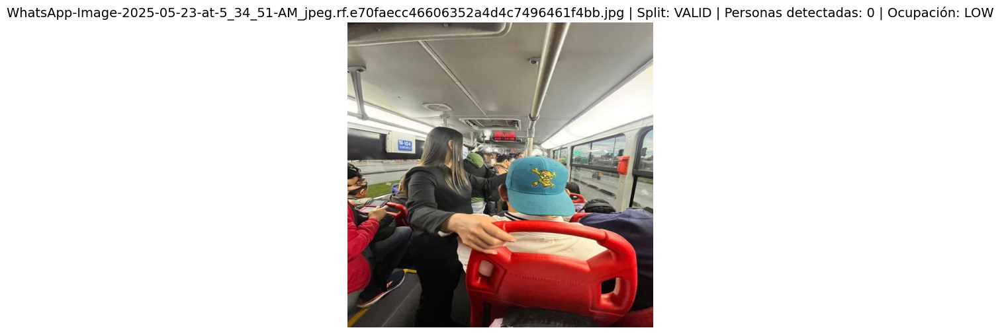

In [13]:
import cv2
import os
import random
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# --- configuramos el modelo básico---
MODEL_PATH = "/content/runs/detect/train12/weights/best.pt"
DATASET_PATH = "/content/dataset"
NUM_IMAGES = 10

OCCUPANCY_THRESHOLDS = {
    "low": 0,
    "medium": 6,
    "full": 10
}

# --- Clasificamos por conteo ---
def clasificar_ocupacion(n):
    if n <= OCCUPANCY_THRESHOLDS["medium"]:
        return "low"
    elif n <= OCCUPANCY_THRESHOLDS["full"]:
        return "medium"
    else:
        return "full"

# --- Cargamos el modelo ---
model = YOLO(MODEL_PATH)

# --- Recolectamos imágenes desde valid y test ---
all_images = []
for split in ["valid", "test"]:
    folder = os.path.join(DATASET_PATH, split, "images")
    for file in os.listdir(folder):
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            all_images.append((split, file))

# --- Seleccionamos 10 imágenes aleatorias ---
random.shuffle(all_images)
selected = all_images[:NUM_IMAGES]

# --- Procesamos las imágenes seleccionadas ---
for split, filename in selected:
    image_path = os.path.join(DATASET_PATH, split, "images", filename)

    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    results = model.predict(source=image_rgb, conf=0.25, verbose=False)
    boxes = results[0].boxes.xyxy.cpu().numpy()

    n_personas = len(boxes)
    clase = clasificar_ocupacion(n_personas)

    # Visualizamos
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(image_rgb)
    for box in boxes:
        x1, y1, x2, y2 = box[:4]
        rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                         linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)

    title = f"{filename} | Split: {split.upper()} | Personas detectadas: {n_personas} | Ocupación: {clase.upper()}"
    ax.set_title(title, fontsize=14)
    ax.axis('off')
    plt.show()

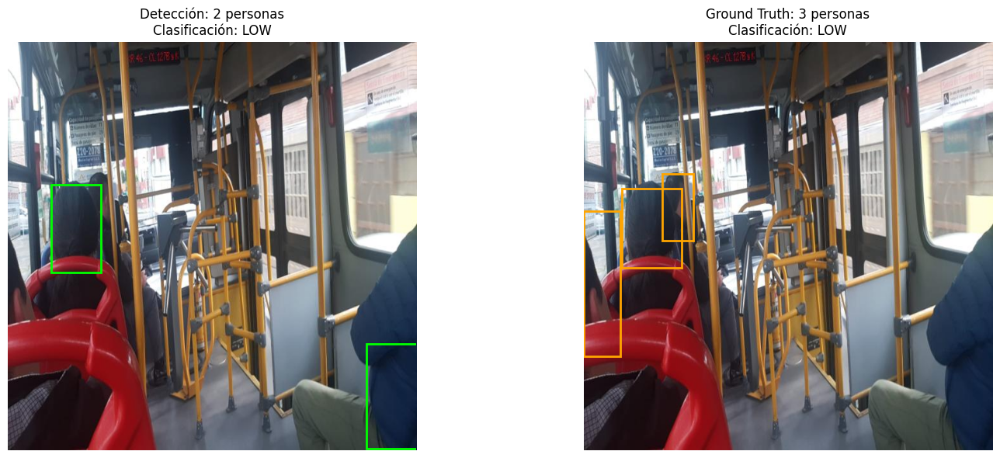

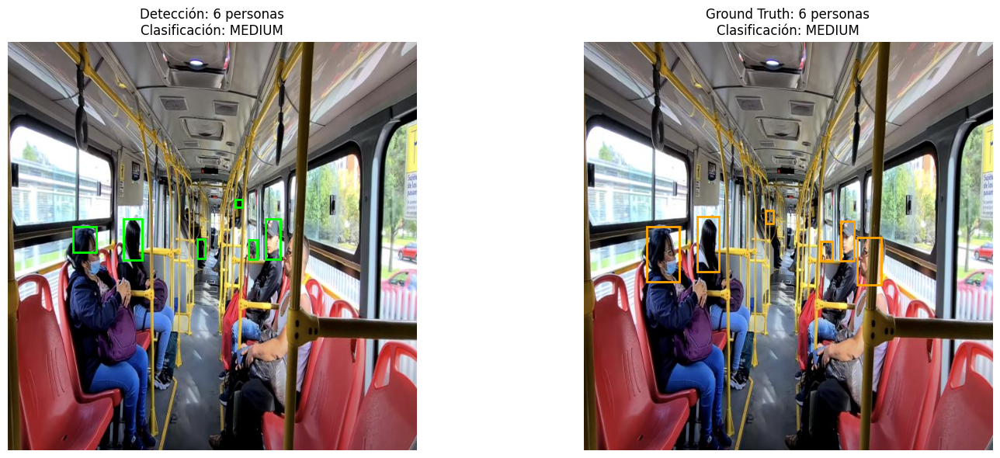

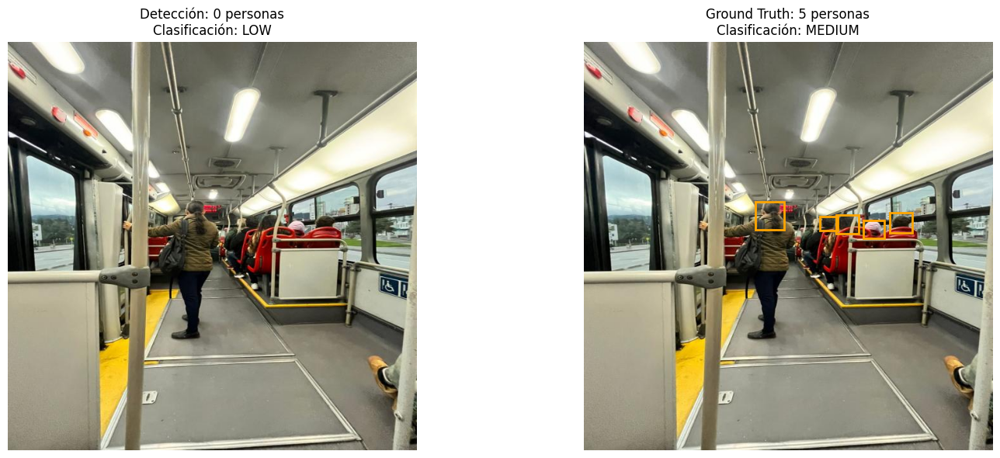

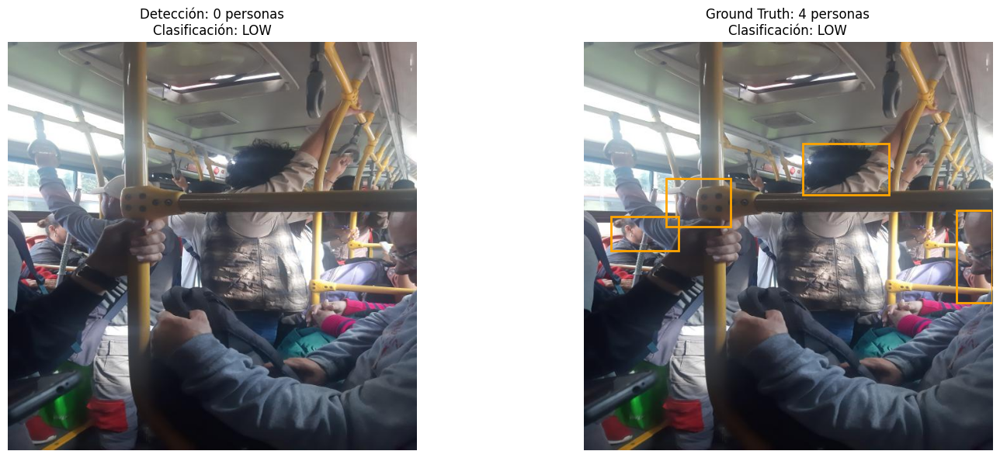

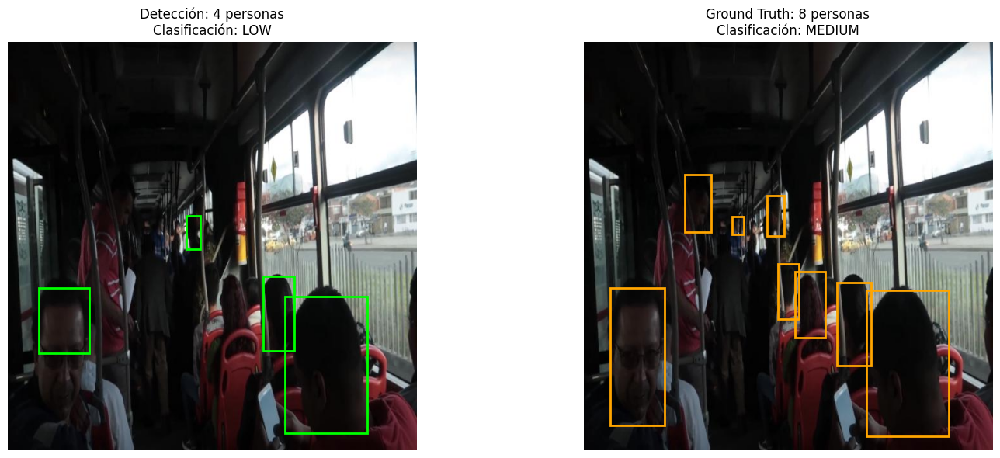

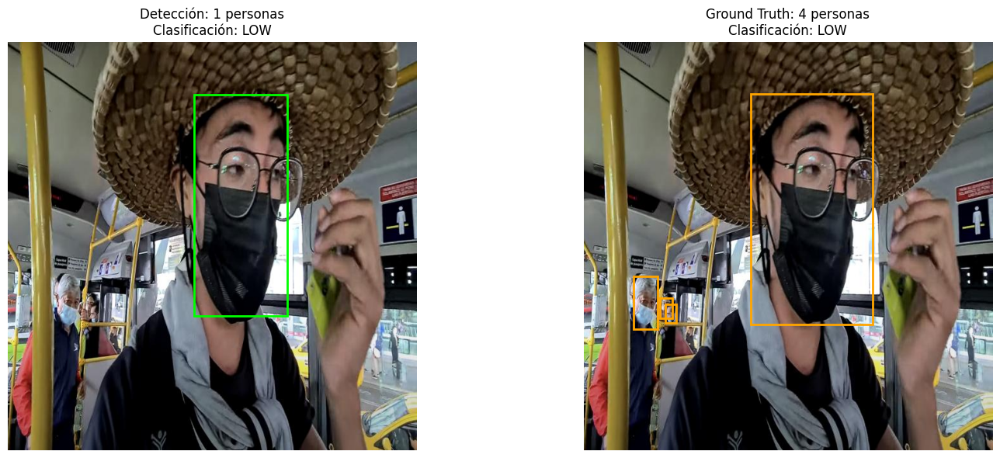

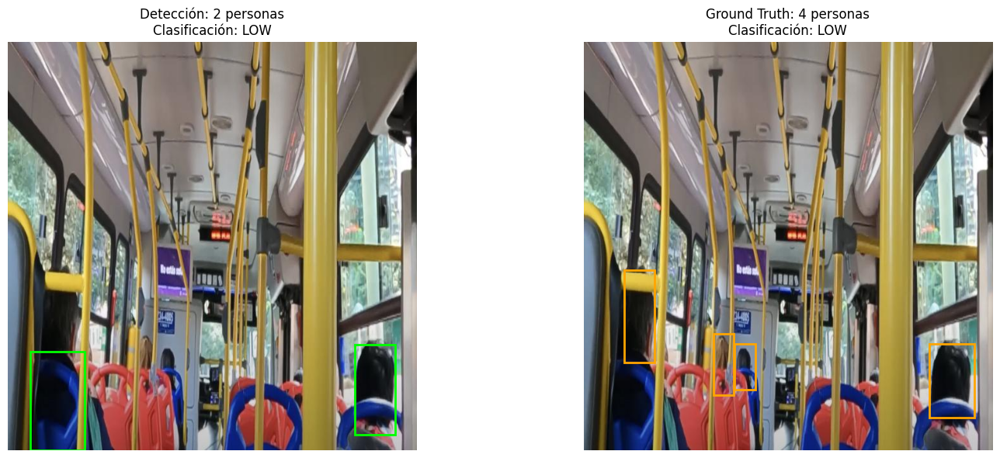

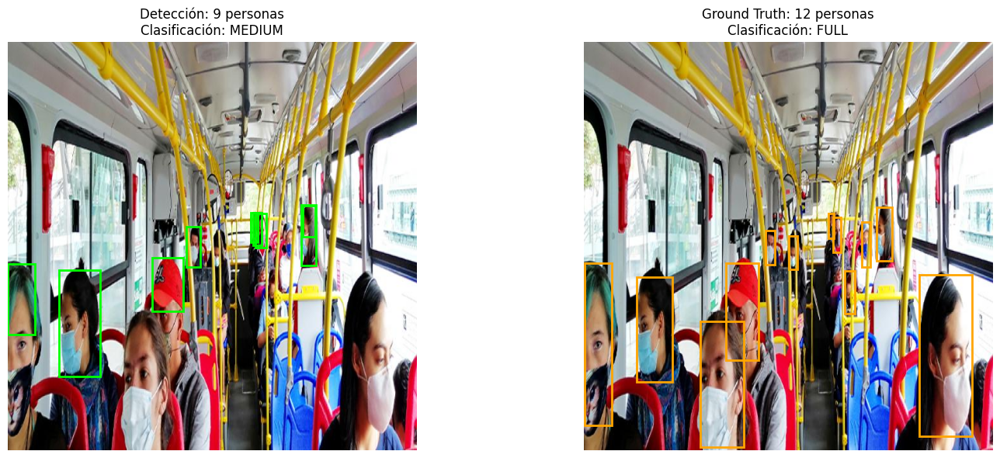

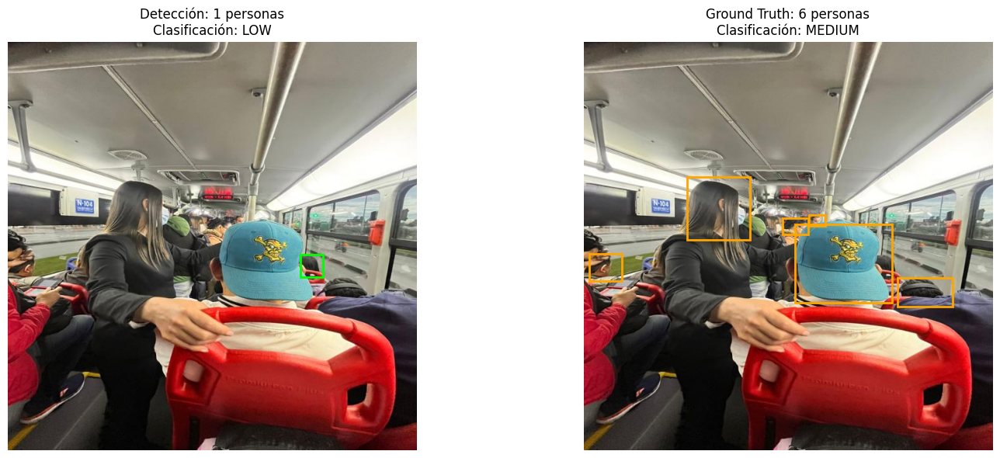

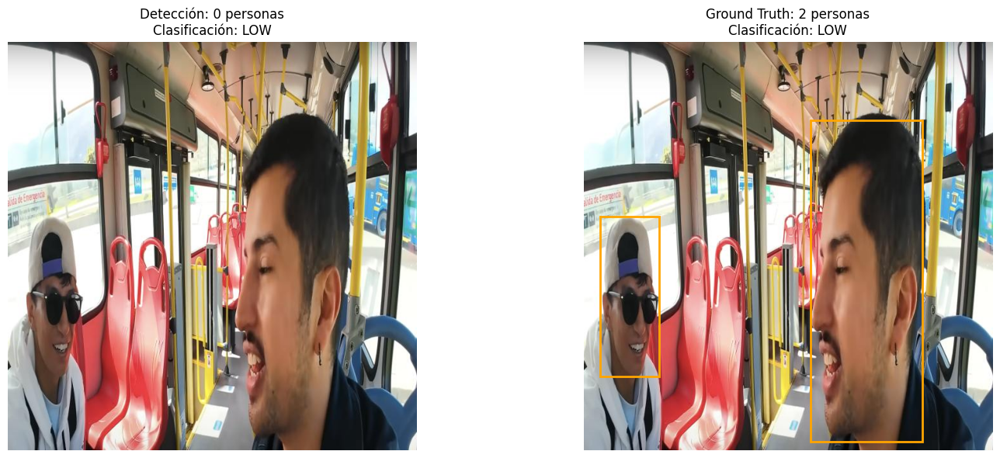

In [14]:
# --- Configuramos con el modelo pro ---
MODEL_PATH = "/content/runs/detect/yolo_personas_tuned/weights/best.pt"
DATASET_PATH = "/content/dataset"
NUM_IMAGES = 10
resultados = []  # Para guardar métricas por imagen

# Umbrales para clasificar ocupación
def clasificar_ocupacion(n):
    if n <= 4:
        return "low"
    elif n <= 10:
        return "medium"
    else:
        return "full"

# --- Recolectamos todas las imágenes disponibles ---
all_images = []
for split in ["valid", "test"]:
    folder = os.path.join(DATASET_PATH, split, "images")
    for file in os.listdir(folder):
        if file.endswith((".jpg", ".png", ".jpeg")):
            all_images.append((split, file))

# --- Seleccionamos aleatoriamente 10 imágenes ---
random.shuffle(all_images)
selected = all_images[:NUM_IMAGES]

# --- Cargamos el modelo ---
model = YOLO(MODEL_PATH)

# --- Procesamos cada imagen ---
for split, filename in selected:
    base = os.path.splitext(filename)[0]
    image_path = os.path.join(DATASET_PATH, split, "images", filename)
    label_path = os.path.join(DATASET_PATH, split, "labels", base + ".txt")

    # Leeemos la imagen
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # --- Inferencia YOLO ---
    results = model.predict(source=image_rgb, conf=0.25, verbose=False)
    pred_boxes = results[0].boxes.xyxy.cpu().numpy()
    n_pred = len(pred_boxes)
    class_pred = clasificar_ocupacion(n_pred)

    # --- Ground truth ---
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            gt_lines = f.readlines()
        n_gt = len([l for l in gt_lines if l.strip() != ""])
    else:
        n_gt = 0
    class_gt = clasificar_ocupacion(n_gt)

    # --- Visualizamos una al lado de la otra ---
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Lado 1: Detección
    axes[0].imshow(image_rgb)
    for box in pred_boxes:
        x1, y1, x2, y2 = box[:4]
        rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                         linewidth=2, edgecolor='lime', facecolor='none')
        axes[0].add_patch(rect)
    axes[0].set_title(f"Detección: {n_pred} personas\nClasificación: {class_pred.upper()}", fontsize=12)
    axes[0].axis("off")

    # Lado 2: Ground truth
    axes[1].imshow(image_rgb)
    if os.path.exists(label_path):
        for line in gt_lines:
            cls, x, y, w, h = map(float, line.strip().split())
            H, W = image.shape[:2]
            x1 = int((x - w/2) * W)
            y1 = int((y - h/2) * H)
            x2 = int((x + w/2) * W)
            y2 = int((y + h/2) * H)
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                             linewidth=2, edgecolor='orange', facecolor='none')
            axes[1].add_patch(rect)
    axes[1].set_title(f"Ground Truth: {n_gt} personas\nClasificación: {class_gt.upper()}", fontsize=12)
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()
    resultados.append({
    "imagen": filename,
    "split": split,
    "personas_reales": n_gt,
    "detectadas": n_pred,
    "clasificación_real": class_gt,
    "clasificación_predicha": class_pred,
    "error_conteo": n_pred - n_gt,
    "acierto_clasificación": class_gt == class_pred
})

In [18]:
output_dir = "/content/output" # Define the output directory path
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [19]:
import pandas as pd

df_resultados = pd.DataFrame(resultados)
print(" Resultados por imagen:")
print(df_resultados)

df_resultados.to_csv("/content/output/resultados_visuales.csv", index=False)

 Resultados por imagen:
                                              imagen  split  personas_reales  \
0  WhatsApp-Image-2025-05-20-at-4_05_18-PM_jpeg.r...  valid                3   
1  Captura-de-pantalla-2025-05-25-092114_png.rf.6...   test                6   
2  WhatsApp-Image-2025-05-23-at-5_39_37-AM_jpeg.r...   test                5   
3  WhatsApp-Image-2025-05-20-at-4_02_36-PM_jpeg.r...  valid                4   
4  Captura-de-pantalla-2025-05-20-122539_png.rf.7...  valid                8   
5  Captura-de-pantalla-2025-05-25-091819_png.rf.f...  valid                4   
6  Captura-de-pantalla-2025-05-20-122905_png.rf.b...   test                4   
7  pubInt152535_jpg.rf.50b31d9d3bee1ede17a851eec1...  valid               12   
8  WhatsApp-Image-2025-05-23-at-5_34_51-AM_jpeg.r...  valid                6   
9  Captura-de-pantalla-2025-05-20-123014_png.rf.8...   test                2   

   detectadas clasificación_real clasificación_predicha  error_conteo  \
0           2         

Esta es la captura de pantalla del
modelo small con hiperparámetros optimizados:

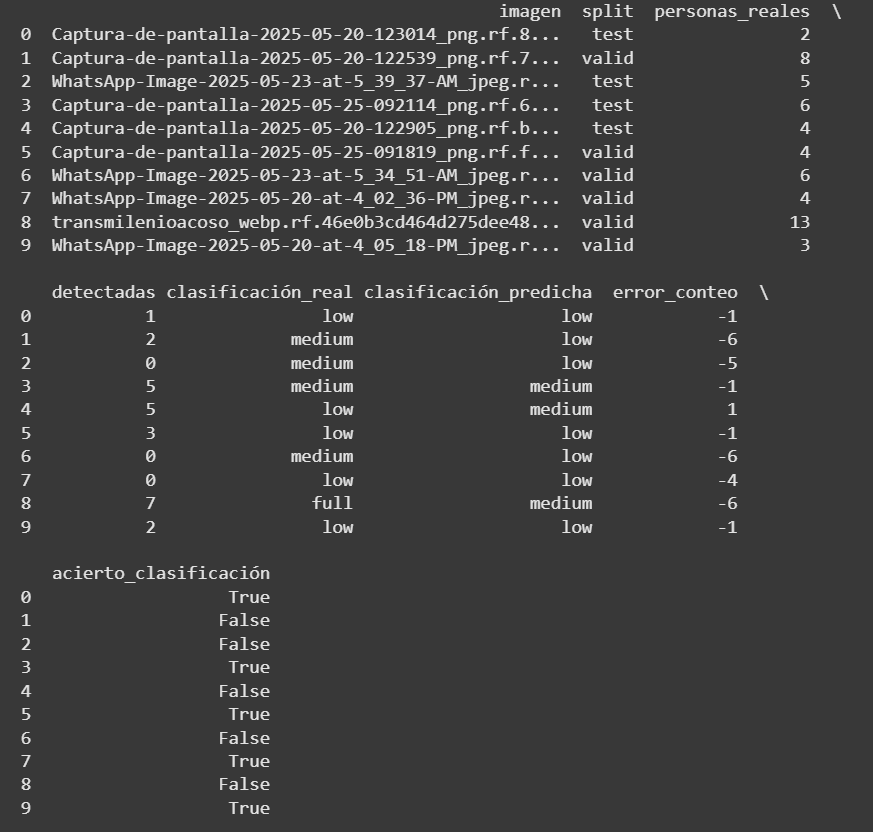

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


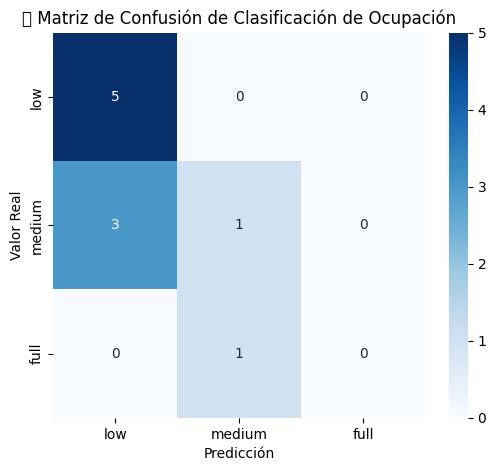

In [20]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

y_true = df_resultados["clasificación_real"]
y_pred = df_resultados["clasificación_predicha"]

# Creamos matriz de confusión
labels = ["low", "medium", "full"]
cm = confusion_matrix(y_true, y_pred, labels=labels)

# Visualizamos con seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title("Matriz de Confusión de Clasificación de Ocupación")
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.show()


Ahora vamos a crear una interfaz bastante sencilla para que se suba cualquier imágen de internet de buses por dentro y se detecten la cantidad de personas.

Recomendación: Usar imágenes en las cuales las personas estén mirando de frente a la cámara

In [21]:
!pip install -q gradio

import gradio as gr
import numpy as np

# Reutilizamos el modelo entrenado
modelo_gradio = YOLO(MODEL_PATH)

def clasificar_ocupacion(n):
    if n <= 4:
        return "low"
    elif n <= 10:
        return "medium"
    else:
        return "full"

def detectar_ocupacion(img):
    img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    results = modelo_gradio.predict(source=img_bgr, conf=0.25, verbose=False)
    boxes = results[0].boxes.xyxy.cpu().numpy()

    ocupacion = clasificar_ocupacion(len(boxes))

    for box in boxes:
        x1, y1, x2, y2 = map(int, box[:4])
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img, f"Ocupación: {ocupacion.upper()} ({len(boxes)} personas)", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 0, 0), 2)

    return img

gr.Interface(
    fn=detectar_ocupacion,
    inputs=gr.Image(type="numpy"),
    outputs=gr.Image(type="numpy"),
    title="Clasificación de Ocupación en Transporte Público"
).launch(debug=False, share=True)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.1/323.1 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 4.2 MB/s eta 0:00:00
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://0ac832924e775a279f.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Segmentación


In [1]:
from zipfile import ZipFile

zip_path = "/content/segmentation.v2i.yolov8.zip"
extract_path = "/content/segmentation_dataset"

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [6]:
# Usamos modelo base de segmentación
model = YOLO('yolov8s-seg.pt') #Usamos el modelo small porque con el m la primera iteración se demoró casi 15min

# Ejecutamos tuning
model.tune(
    data='/content/segmentation_dataset/data.yaml',
    epochs=50,
    imgsz=640,
    batch=8,
    iterations=8,         #Usamos pocas iteraciones porque no tenemos demasiado tiempo
    optimizer='Adam',
    name='tune_segmentacion_personas',
    plots=True
)

Tuner: Initialized Tuner instance with 'tune_dir=runs/segment/tune_segmentacion_personas2'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/8 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'cutmix': 0.0, 'copy_paste': 0.0}
Saved runs/segment/tune_segmentacion_personas2/tune_scatter_plots.png
Saved runs/segment/tune_segmentacion_personas2/tune_fitness.png

Tuner: 1/8 iterations complete ✅ (171.96s)
Tuner: Results saved to runs/segment/tune_segmentacion_personas2
Tuner: Best fitness=0.41565 observed at iteration 1
Tuner: Best fitness metrics are {'metrics/precision(B)': 0.5898, 'metrics/recall(B)': 0.32

In [10]:
# Cargamos hiperparámetros
with open("runs/segment/tune_segmentacion_personas2/best_hyperparameters.yaml") as f:
    hyp_params = yaml.safe_load(f)

# Reentrenamos modelo base con los hiperparámetros óptimos
model = YOLO("yolov8s-seg.pt")

model.train(
    data="/content/segmentation_dataset/data.yaml",
    epochs=100,
    batch=4,
    imgsz=640,
    patience=40,
    name="segmentacion_personas_tuned_final",
    **hyp_params
)

Ultralytics 8.3.145 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.15442, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.51081, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/segmentation_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.38301, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5619, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01085, hsv_s=0.74251, hsv_v=0.40126, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.00874, lrf=0.00932, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-seg.pt, momentum=0.94608, mosaic=0.8978, multi_scale=False, name=segmentacion_personas_tuned_final, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, over

train: Scanning /content/segmentation_dataset/train/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 339.3±74.3 MB/s, size: 69.3 KB)


val: Scanning /content/segmentation_dataset/valid/labels.cache... 7 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7/7 [00:00<?, ?it/s]


Plotting labels to runs/segment/segmentacion_personas_tuned_final/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00874' and 'momentum=0.94608' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.00059), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/segmentacion_personas_tuned_final
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.42G      1.879      3.678      2.833        1.6         89        640: 100%|██████████| 16/16 [00:05<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all          7         58      0.183      0.397      0.245     0.0833      0.194      0.397      0.254      0.114



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.63G      1.489       2.85      1.942      1.305         38        640: 100%|██████████| 16/16 [00:03<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all          7         58      0.359      0.414      0.315      0.201      0.344      0.379      0.294      0.179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.67G      1.423      2.779      1.841      1.252         55        640: 100%|██████████| 16/16 [00:03<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.16it/s]

                   all          7         58      0.425      0.293      0.274      0.141       0.35      0.241      0.188     0.0884



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.71G       1.47      2.808      1.894      1.296        100        640: 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

                   all          7         58      0.197      0.345      0.227     0.0878      0.129      0.397     0.0966     0.0276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.71G      1.485      2.903      1.826      1.306         25        640: 100%|██████████| 16/16 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.83it/s]

                   all          7         58      0.217      0.414      0.194     0.0811      0.189      0.379      0.135     0.0519



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.71G       1.43       2.75      1.903      1.257         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]

                   all          7         58      0.197      0.276      0.134     0.0593      0.151      0.362      0.121     0.0395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.71G      1.489      2.923      1.893      1.304         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all          7         58      0.127      0.379      0.111     0.0509      0.134      0.293     0.0925     0.0375

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.71G      1.475      3.073      1.903      1.306         37        640: 100%|██████████| 16/16 [00:02<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.68it/s]

                   all          7         58      0.312       0.25       0.26      0.117       0.22      0.207      0.144     0.0336



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.71G      1.631       3.28      1.961      1.419         27        640: 100%|██████████| 16/16 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

                   all          7         58      0.328      0.466      0.283      0.109      0.256      0.362      0.172     0.0588



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.71G      1.503      2.972      1.789      1.313         63        640: 100%|██████████| 16/16 [00:03<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.77it/s]

                   all          7         58        0.4      0.448      0.315      0.137      0.265      0.431      0.211     0.0843



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.71G      1.475      2.837      1.664      1.292         89        640: 100%|██████████| 16/16 [00:02<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

                   all          7         58      0.454      0.345      0.295      0.124      0.409       0.31      0.252     0.0898



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.71G      1.393      2.711      1.595      1.248         49        640: 100%|██████████| 16/16 [00:02<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

                   all          7         58      0.399      0.321      0.277      0.122      0.346      0.379      0.225     0.0947



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.71G      1.314      2.565      1.418      1.209         84        640: 100%|██████████| 16/16 [00:03<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all          7         58      0.288      0.414      0.286      0.125      0.301      0.431      0.226     0.0849



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.71G       1.36      2.488       1.47       1.25         41        640: 100%|██████████| 16/16 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

                   all          7         58      0.369      0.466      0.355      0.162      0.294      0.586      0.304       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.71G      1.289      2.463      1.339      1.176         52        640: 100%|██████████| 16/16 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

                   all          7         58      0.391      0.552      0.394      0.195      0.288      0.483      0.266      0.117



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.75G      1.307       2.56      1.417      1.187         22        640: 100%|██████████| 16/16 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]

                   all          7         58      0.664      0.379      0.474      0.252      0.447      0.446      0.403      0.179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.75G      1.304      2.406      1.435       1.23         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.78it/s]

                   all          7         58      0.608      0.507      0.513      0.286       0.53      0.517      0.473      0.218



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.75G      1.265      2.303      1.355      1.182         68        640: 100%|██████████| 16/16 [00:02<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

                   all          7         58       0.58      0.572      0.534      0.314      0.592      0.483      0.479      0.219



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.79G      1.256      2.309      1.358      1.205         35        640: 100%|██████████| 16/16 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

                   all          7         58      0.597      0.511      0.504      0.269      0.685        0.5      0.496      0.219



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.79G      1.237      2.293      1.234      1.161         50        640: 100%|██████████| 16/16 [00:03<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


                   all          7         58      0.647      0.448      0.498      0.255      0.602      0.448      0.484      0.226

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.79G      1.218      2.151      1.148      1.128         70        640: 100%|██████████| 16/16 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]

                   all          7         58      0.724      0.362      0.456      0.241      0.758      0.379      0.443       0.21



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.79G      1.214      2.151      1.202       1.18         48        640: 100%|██████████| 16/16 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]

                   all          7         58      0.681      0.431      0.461       0.27      0.735      0.466      0.498       0.25



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.79G      1.172      2.084      1.196      1.157         61        640: 100%|██████████| 16/16 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

                   all          7         58      0.464      0.517       0.46      0.264      0.709       0.42      0.491      0.234



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.79G      1.158      2.074      1.132      1.113         52        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

                   all          7         58      0.512      0.524      0.477      0.247      0.598      0.483      0.481      0.228



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.79G      1.162      2.159      1.162      1.107         40        640: 100%|██████████| 16/16 [00:02<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]

                   all          7         58      0.625      0.448      0.448      0.244      0.625      0.448      0.469      0.238



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.79G      1.108       2.11      1.136      1.113         29        640: 100%|██████████| 16/16 [00:03<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

                   all          7         58      0.564      0.534       0.51      0.283      0.669      0.534      0.524      0.269



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.79G      1.103      1.986      1.115       1.11         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all          7         58      0.648        0.5      0.489      0.268      0.633        0.5      0.492      0.257



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.79G      1.112       1.96      1.089       1.08         86        640: 100%|██████████| 16/16 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

                   all          7         58      0.622      0.466      0.468      0.258      0.649      0.479      0.486      0.247



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.79G      1.059      1.843       1.02      1.068         23        640: 100%|██████████| 16/16 [00:02<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.94it/s]

                   all          7         58      0.773      0.414      0.487      0.282      0.807      0.431      0.488      0.259



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.79G      1.033       1.92     0.9819      1.053         73        640: 100%|██████████| 16/16 [00:02<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all          7         58      0.729      0.379      0.465      0.251      0.752      0.448      0.493      0.247



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.79G      1.088      1.812      1.007      1.078         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.02it/s]

                   all          7         58      0.601      0.431      0.502      0.269       0.82      0.379      0.492      0.253



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.79G      1.074       1.99      1.018      1.071         54        640: 100%|██████████| 16/16 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.17it/s]

                   all          7         58      0.792      0.395      0.496      0.297      0.791      0.379      0.468      0.241



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.79G      1.012      1.654     0.9569       1.02         52        640: 100%|██████████| 16/16 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

                   all          7         58      0.642      0.466      0.508      0.313       0.71      0.421       0.49      0.243



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.79G     0.9902      1.671     0.9458      1.052         29        640: 100%|██████████| 16/16 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

                   all          7         58      0.657      0.462      0.484       0.29      0.679      0.475      0.501      0.232



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.79G     0.9921      1.786     0.9496      1.028         36        640: 100%|██████████| 16/16 [00:03<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.71it/s]

                   all          7         58      0.687      0.416      0.498      0.282      0.687      0.416      0.481      0.237



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.79G      1.009      1.805     0.9473      1.057         39        640: 100%|██████████| 16/16 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.41it/s]

                   all          7         58      0.788      0.379      0.496      0.268      0.758      0.378       0.45      0.222



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.79G     0.9782      1.733     0.8748      1.027         37        640: 100%|██████████| 16/16 [00:02<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all          7         58       0.66      0.379      0.425      0.235      0.705      0.397      0.433      0.198



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.79G     0.9844      1.749     0.8928       1.02         36        640: 100%|██████████| 16/16 [00:03<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all          7         58      0.586      0.379      0.405      0.225       0.64      0.414      0.456       0.21



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.79G     0.9338       1.61     0.9159      1.009         17        640: 100%|██████████| 16/16 [00:02<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]

                   all          7         58      0.689      0.397      0.457      0.253      0.749      0.431      0.508      0.254



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.79G     0.9624      1.647     0.8643      1.019         41        640: 100%|██████████| 16/16 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.56it/s]

                   all          7         58      0.603        0.5       0.48      0.309      0.603        0.5       0.48      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.79G     0.8615      1.484     0.7854     0.9774         45        640: 100%|██████████| 16/16 [00:02<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

                   all          7         58      0.614      0.552      0.503      0.336      0.594      0.534      0.503      0.298



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.79G     0.9224       1.68      0.827     0.9801         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]

                   all          7         58      0.724      0.466      0.508      0.323      0.724      0.466      0.507      0.294



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.79G     0.9298      1.531     0.8158     0.9978         33        640: 100%|██████████| 16/16 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

                   all          7         58      0.658      0.517      0.513       0.34      0.654      0.517      0.497      0.289



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.79G     0.9194      1.589      0.822     0.9939         49        640: 100%|██████████| 16/16 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]

                   all          7         58      0.729      0.463      0.518      0.339      0.729      0.463      0.491      0.285



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.79G     0.8672      1.496     0.7848     0.9657         46        640: 100%|██████████| 16/16 [00:03<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all          7         58      0.792      0.448      0.501      0.323      0.756      0.483      0.525      0.288



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.79G     0.8864      1.478     0.8048      1.002         38        640: 100%|██████████| 16/16 [00:02<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]

                   all          7         58      0.809      0.448      0.511       0.33      0.831      0.466      0.529       0.29



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.79G      0.836      1.455     0.7379     0.9513         71        640: 100%|██████████| 16/16 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

                   all          7         58      0.816        0.5      0.582      0.336      0.874      0.481      0.557      0.307



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.79G      0.924      1.612     0.7847     0.9933         57        640: 100%|██████████| 16/16 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.73it/s]

                   all          7         58      0.773       0.47      0.542      0.325      0.696        0.5      0.562      0.299



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.79G     0.8927      1.522     0.7529     0.9894         58        640: 100%|██████████| 16/16 [00:03<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.18it/s]

                   all          7         58       0.66      0.448      0.507      0.313       0.71      0.483      0.519      0.285



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.79G     0.8827      1.547      0.759     0.9805         39        640: 100%|██████████| 16/16 [00:02<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]

                   all          7         58      0.536      0.478      0.489      0.312      0.808      0.397      0.512       0.27



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.79G     0.8159      1.407      0.705     0.9437         35        640: 100%|██████████| 16/16 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.45it/s]

                   all          7         58      0.662      0.405      0.481      0.308       0.69      0.423        0.5      0.268



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.79G     0.8107       1.42      0.714     0.9371         17        640: 100%|██████████| 16/16 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all          7         58      0.634      0.478      0.487      0.286      0.617      0.466      0.485      0.264



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.79G     0.8704       1.49     0.7635       0.98         53        640: 100%|██████████| 16/16 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.78it/s]

                   all          7         58      0.521      0.526      0.502      0.318      0.506      0.512      0.492      0.279



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.79G     0.8358      1.455     0.7145     0.9551         70        640: 100%|██████████| 16/16 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

                   all          7         58      0.592      0.431      0.513      0.319      0.585      0.466      0.516      0.299



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.79G     0.8596      1.366      0.723     0.9613         45        640: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]

                   all          7         58      0.644      0.498      0.517      0.327      0.684      0.534      0.537      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.79G     0.8226      1.346     0.7201     0.9479         69        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


                   all          7         58      0.773      0.448      0.521       0.33      0.773      0.448      0.511      0.282

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.79G     0.7822      1.352     0.6838     0.9162         28        640: 100%|██████████| 16/16 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.88it/s]

                   all          7         58      0.805      0.426      0.513      0.353      0.729      0.414      0.488      0.279



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.79G     0.7804      1.358     0.6633     0.9235         42        640: 100%|██████████| 16/16 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all          7         58      0.726      0.448      0.523      0.352      0.726      0.448      0.517       0.29



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.79G     0.7936      1.312     0.6861       0.94         94        640: 100%|██████████| 16/16 [00:03<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all          7         58      0.698      0.478      0.509      0.346      0.714      0.517      0.509      0.281



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.79G     0.7761      1.351     0.6904     0.9157         47        640: 100%|██████████| 16/16 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

                   all          7         58       0.69      0.517      0.518      0.328       0.69      0.517      0.517      0.278



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.79G     0.8126      1.363      0.711     0.9592         50        640: 100%|██████████| 16/16 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]

                   all          7         58      0.622       0.51      0.511       0.32      0.601      0.494      0.485      0.275



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.79G     0.8209      1.377     0.7222     0.9482         70        640: 100%|██████████| 16/16 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]

                   all          7         58      0.663        0.5      0.518      0.326      0.648      0.483       0.49      0.283



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.79G     0.7796      1.302     0.6711     0.9482         39        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.71it/s]

                   all          7         58      0.664      0.534      0.527      0.339      0.627      0.517      0.507      0.289



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.79G     0.7836      1.298     0.6498     0.9326         76        640: 100%|██████████| 16/16 [00:02<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

                   all          7         58      0.689        0.5      0.522      0.339      0.735      0.478      0.524      0.303



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.79G     0.7276      1.214     0.6373     0.9087         41        640: 100%|██████████| 16/16 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

                   all          7         58      0.644        0.5       0.52      0.324      0.699      0.481      0.519      0.302



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.79G     0.7723      1.246     0.6286     0.9153         41        640: 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]

                   all          7         58      0.673      0.427      0.505      0.324      0.833      0.431      0.527      0.309



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.79G     0.7355      1.199     0.6242     0.9201         44        640: 100%|██████████| 16/16 [00:03<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all          7         58      0.584      0.483      0.496      0.306      0.702      0.431      0.497      0.294

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.79G     0.7813      1.441     0.6768      0.931         61        640: 100%|██████████| 16/16 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all          7         58      0.638      0.431      0.484      0.315      0.661      0.431      0.493      0.291



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.79G     0.7567      1.232     0.6541     0.9063         54        640: 100%|██████████| 16/16 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

                   all          7         58      0.699      0.431      0.494      0.315      0.697      0.431      0.484      0.284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.79G     0.7547      1.306     0.6329     0.9076         67        640: 100%|██████████| 16/16 [00:03<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

                   all          7         58      0.656      0.414      0.494      0.317      0.683      0.431      0.498      0.297



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.79G     0.7097      1.206     0.6144     0.9037         53        640: 100%|██████████| 16/16 [00:02<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]

                   all          7         58      0.544      0.517       0.52      0.343      0.563      0.517      0.511      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.79G     0.7185      1.092     0.6147     0.9002         56        640: 100%|██████████| 16/16 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.08it/s]

                   all          7         58      0.664      0.466      0.515      0.351      0.647        0.5      0.526      0.319



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.79G     0.7238      1.221     0.6185      0.907         28        640: 100%|██████████| 16/16 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


                   all          7         58      0.744      0.466      0.545      0.377      0.744      0.466      0.551       0.34

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.79G     0.6958      1.174     0.5918      0.896         45        640: 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]

                   all          7         58      0.809      0.437      0.541      0.381      0.724      0.498      0.563      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.79G     0.7157      1.129     0.5863     0.9056         38        640: 100%|██████████| 16/16 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.96it/s]

                   all          7         58      0.833      0.431      0.552      0.383      0.716      0.479      0.553      0.339



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.79G      0.691      1.155      0.594     0.9115         84        640: 100%|██████████| 16/16 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]

                   all          7         58      0.797      0.448      0.571      0.388      0.666        0.5      0.553       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.79G      0.666      1.105     0.5453     0.8765         56        640: 100%|██████████| 16/16 [00:03<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

                   all          7         58      0.829      0.483      0.585      0.391      0.762      0.497      0.572      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.79G     0.6951      1.196     0.5754     0.8821         90        640: 100%|██████████| 16/16 [00:02<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.12it/s]

                   all          7         58      0.757        0.5       0.59      0.405      0.762      0.517      0.585      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.79G      0.659      1.051     0.5726     0.8865         30        640: 100%|██████████| 16/16 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.01it/s]

                   all          7         58      0.662      0.517      0.559      0.411      0.715      0.517      0.574      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.79G     0.6782      1.147     0.5776     0.8991         70        640: 100%|██████████| 16/16 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.87it/s]

                   all          7         58      0.739      0.488      0.564      0.416      0.739      0.488      0.544      0.343



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.79G      0.653      1.033     0.5358     0.8804         51        640: 100%|██████████| 16/16 [00:03<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.53it/s]

                   all          7         58      0.734      0.466      0.531      0.395      0.761      0.483      0.521      0.332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.79G     0.6641      1.075     0.5541     0.8716         53        640: 100%|██████████| 16/16 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.98it/s]

                   all          7         58      0.736      0.481      0.544      0.377      0.762      0.498      0.544      0.334



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.79G     0.6744      1.129     0.5599     0.8682         42        640: 100%|██████████| 16/16 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]

                   all          7         58      0.694      0.483      0.544      0.372      0.694      0.483      0.537      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.79G     0.6349      1.042      0.536     0.8539         37        640: 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

                   all          7         58      0.697      0.477      0.548      0.376      0.697      0.477       0.53       0.33



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.79G     0.6745      1.153     0.5552     0.8911         23        640: 100%|██████████| 16/16 [00:02<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

                   all          7         58       0.77      0.448      0.539      0.383      0.689        0.5      0.537      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.79G      0.608     0.9671     0.5441     0.8545         26        640: 100%|██████████| 16/16 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]

                   all          7         58      0.713      0.448      0.526      0.369      0.698      0.517       0.54      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.79G     0.6644      1.065     0.5384     0.8856         37        640: 100%|██████████| 16/16 [00:02<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]

                   all          7         58      0.758      0.433      0.536      0.372      0.658      0.517      0.545      0.327



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.79G     0.6254      1.053     0.5211     0.8784         68        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.30it/s]

                   all          7         58       0.78      0.431      0.534      0.363      0.628        0.5      0.541      0.327



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.79G      0.632     0.9983     0.5208     0.8641         40        640: 100%|██████████| 16/16 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.89it/s]

                   all          7         58        0.8      0.448      0.539      0.361       0.69      0.499      0.548      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.79G     0.6432      1.077     0.5303     0.8629         34        640: 100%|██████████| 16/16 [00:02<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]

                   all          7         58       0.66      0.501      0.547      0.363      0.691      0.552      0.557      0.336


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.79G      0.582      1.012     0.4843     0.8237         45        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.02it/s]

                   all          7         58        0.7      0.483      0.549      0.375      0.675      0.574      0.589      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.79G     0.5969      1.023     0.4906     0.8526         39        640: 100%|██████████| 16/16 [00:02<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all          7         58      0.628      0.524      0.548       0.37      0.694      0.585      0.586       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.79G     0.5911     0.9497     0.4839     0.8483         13        640: 100%|██████████| 16/16 [00:02<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.88it/s]

                   all          7         58      0.763      0.466      0.551      0.373      0.666      0.569      0.589      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.79G     0.5859      0.954     0.4728     0.8481         24        640: 100%|██████████| 16/16 [00:02<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.68it/s]

                   all          7         58      0.764      0.466      0.551      0.372      0.628      0.582      0.586      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.79G     0.5707     0.9711     0.4699     0.8346         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

                   all          7         58      0.572      0.554       0.56      0.377      0.655      0.603      0.591      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.79G     0.5724      0.928     0.4687     0.8403         12        640: 100%|██████████| 16/16 [00:02<00:00,  6.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]

                   all          7         58       0.67        0.5      0.566      0.379      0.719      0.534       0.59      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.79G     0.5706     0.9443     0.4658      0.831         24        640: 100%|██████████| 16/16 [00:02<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]

                   all          7         58      0.701      0.483      0.567      0.383      0.756      0.534      0.593      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.79G     0.5801      1.011     0.4689      0.853         23        640: 100%|██████████| 16/16 [00:02<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.13it/s]

                   all          7         58      0.728      0.517      0.573      0.387      0.737      0.552      0.593      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.79G     0.5844     0.9752     0.4566     0.8386         14        640: 100%|██████████| 16/16 [00:03<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]

                   all          7         58      0.729        0.5      0.569      0.392      0.726      0.552      0.592      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.79G     0.5363     0.8894     0.4554     0.8432         46        640: 100%|██████████| 16/16 [00:02<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

                   all          7         58      0.599      0.569      0.568      0.391      0.618      0.586      0.572      0.355



100 epochs completed in 0.103 hours.
Optimizer stripped from runs/segment/segmentacion_personas_tuned_final/weights/last.pt, 23.9MB
Optimizer stripped from runs/segment/segmentacion_personas_tuned_final/weights/best.pt, 23.9MB

Validating runs/segment/segmentacion_personas_tuned_final/weights/best.pt...
Ultralytics 8.3.145 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 85 layers, 11,779,987 parameters, 0 gradients, 42.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]


                   all          7         58      0.662      0.517      0.559      0.408      0.716      0.517      0.574      0.353
Speed: 0.6ms preprocess, 5.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/segment/segmentacion_personas_tuned_final


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7eb6fd315390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

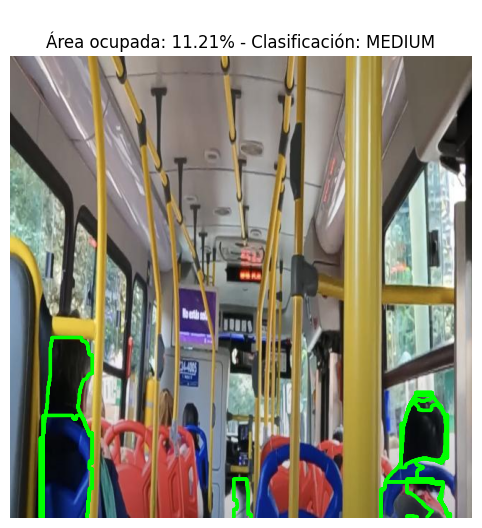

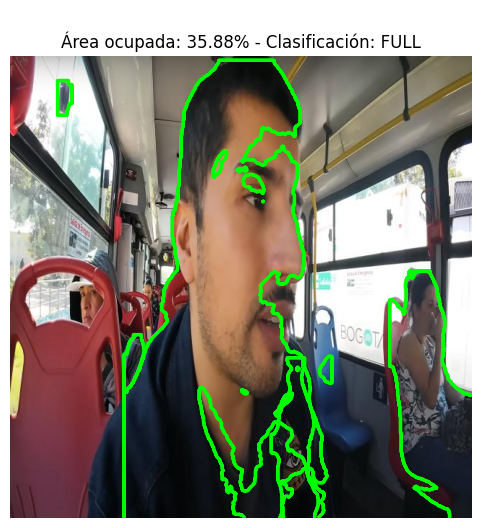

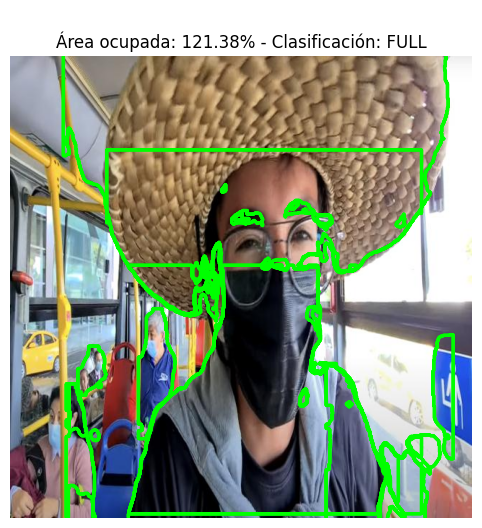

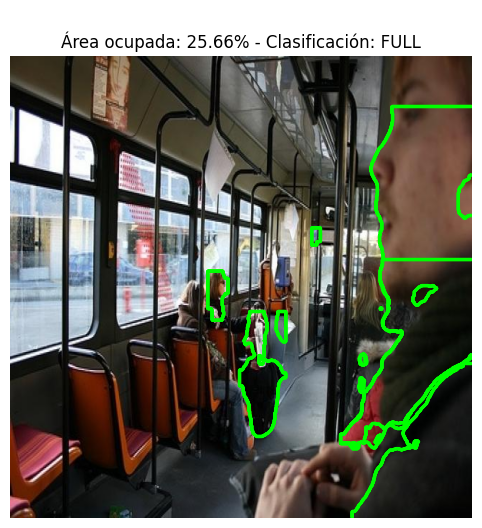

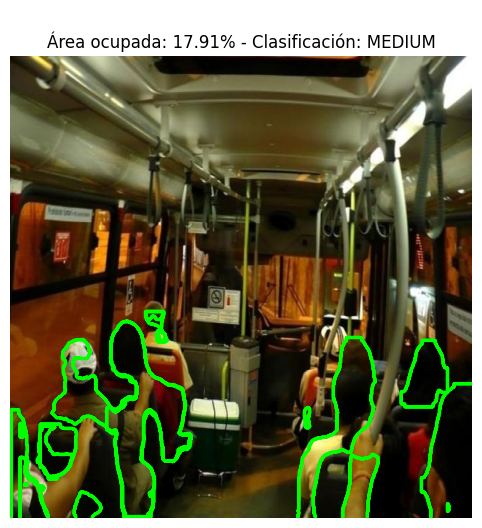

In [14]:
from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import random

# --- Configuramos el modelo pro ---
MODEL_PATH = "/content/runs/segment/segmentacion_personas_tuned_final/weights/best.pt"
IMG_DIR = "/content/segmentation_dataset/test/images"
NUM_IMAGES = 5

# --- Umbrales de ocupación (ajustables) ---
def clasificar_por_area(pct):
    if pct <= 8:
        return "low"
    elif pct <= 18:
        return "medium"
    else:
        return "full"

# --- Cargamos el modelo de segmentación ---
model = YOLO(MODEL_PATH)

# --- Seleccionamos imágenes aleatorias del test set ---
all_images = [f for f in os.listdir(IMG_DIR) if f.lower().endswith((".jpg", ".png", ".jpeg"))]
random.shuffle(all_images)
selected = all_images[:NUM_IMAGES]

# --- Procesamos cada imagen ---
for filename in selected:
    path = os.path.join(IMG_DIR, filename)
    image = cv2.imread(path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    H, W = image.shape[:2]
    total_area = H * W

    results = model.predict(source=image_rgb, task='segment', conf=0.25, verbose=False)
    result = results[0]
    masks = result.masks.data.cpu().numpy() if result.masks is not None else []

    # Calculamos área total de las máscaras
    total_mask_area = sum(np.sum(mask) for mask in masks)
    pct_ocupado = (total_mask_area / total_area) * 100
    clase_area = clasificar_por_area(pct_ocupado)

    # Visualizamos
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(f"\nÁrea ocupada: {pct_ocupado:.2f}% - Clasificación: {clase_area.upper()}", fontsize=12)

    for mask in masks:
        plt.contour(mask, colors='lime', linewidths=2)

    plt.axis("off")
    plt.show()

Ahora vamos a hacer otra interfaz como la de arriba, en este caso para segmentar y hallar el % de ocupación en los buses

In [18]:
!pip install -q gradio
import gradio as gr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.1/323.1 kB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 100.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 5.8 MB/s eta 0:00:00


In [20]:
# Cargamos modelo de segmentación entrenado
modelo_gradio = YOLO("/content/runs/segment/segmentacion_personas_tuned_final/weights/best.pt")

# Clasificamos según área ocupada
def clasificar_por_area(pct):
    if pct <= 4:
        return "low"
    elif pct <= 12:
        return "medium"
    else:
        return "full"

# Función que se ejecuta en la interfaz
def segmentar_y_clasificar(img):
    img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    H, W = img.shape[:2]
    total_area = H * W

    results = modelo_gradio.predict(source=img_bgr, task='segment', conf=0.25, verbose=False)
    result = results[0]
    masks = result.masks.data.cpu().numpy() if result.masks is not None else []

    total_mask_area = sum(np.sum(mask) for mask in masks)
    pct_ocupado = (total_mask_area / total_area) * 100
    clase_area = clasificar_por_area(pct_ocupado)

    # Dibujamos contornos sobre la imagen
    img_out = img.copy()
    for mask in masks:
        contour, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(img_out, contour, -1, (0, 255, 0), 2)

    texto = f"{clase_area.upper()} - {pct_ocupado:.2f}% ocupado"
    cv2.putText(img_out, texto, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 0, 0), 2)

    return img_out

# Creamos la interfaz
gr.Interface(
    fn=segmentar_y_clasificar,
    inputs=gr.Image(type="numpy"),
    outputs=gr.Image(type="numpy"),
    title="🚌 Clasificación por Segmentación del Nivel de Ocupación"
).launch(debug=False, share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://aacae49a0ff8bfa06e.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
